This notebook creates figure to show how I do unwrapping. First have to filter, then unwrap, then add the noise back in to get unfiltered, unwrapped interferograms. 

<br>
Notebook written [note sure], edited 11-27-23. 

***
***

In [33]:
import os,sys
import glob
import math
from osgeo import gdal
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
from matplotlib.patches import Rectangle
import isce
import isceobj
from contrib.Snaphu.Snaphu import Snaphu
import shutil
%matplotlib  widget

In [34]:
workdir = '/data/ocp4/LagunaSalada/Data_and_Figs/cropped_9000_1800_18000_3600/'
outputdir = '/data/ocp4/LagunaSalada/Data_and_Figs/cropped_9000_1800_18000_3600/cropped_LS_with_western_mtns/'

# load in dates
dates = [os.path.basename(x) for x in glob.glob(workdir+"SLC_vv/2*")]
dates = sorted(dates)
nd = len(dates)
print(dates)

['20170510', '20170522', '20170603', '20170615', '20170627', '20170709', '20170721', '20170802', '20170814', '20170826', '20170907', '20170919', '20171013', '20171025', '20171106', '20171118', '20171130', '20171212', '20171224', '20180105', '20180117', '20180129', '20180210', '20180222', '20180306', '20180318', '20180330', '20180411', '20180423', '20180505', '20180517', '20180529', '20180610', '20180622', '20180704', '20180716', '20180728', '20180809', '20180821', '20180902', '20180914', '20180926', '20181008', '20181020', '20181101', '20181113', '20181125', '20181207', '20181219', '20181231', '20190112', '20190124', '20190205', '20190217', '20190301', '20190313', '20190325', '20190406', '20190430', '20190512', '20190524', '20190605', '20190617', '20190629', '20190711', '20190723', '20190804', '20190816', '20190822', '20190828', '20190903', '20190909', '20190915', '20190921', '20190927', '20191003', '20191009', '20191015', '20191021', '20191027', '20191102', '20191108', '20191114', '20

In [35]:
# define the dates. 
date1='20181125'
date2='20181207'

In [36]:
# region to read in of SLCs
x1 = 18000; x2 = 14000
y1 = 2100;  y2 = 1000
dx = x1-x2
dy = y1-y2

In [37]:
# Read in 2 full SLCs to make interferogram 
ds = gdal.Open(workdir+"/SLC_vv/"+date1+"/"+date1+".slc.full", gdal.GA_ReadOnly)
slc1 = ds.GetRasterBand(1).ReadAsArray(x2,y2,dx,dy)
print('SLC 1 loaded.')
ds = gdal.Open(workdir+"/SLC_vv/"+date2+"/"+date2+".slc.full", gdal.GA_ReadOnly)
slc2 = ds.GetRasterBand(1).ReadAsArray(x2,y2,dx,dy)
print('SLC 2 loaded.')

SLC 1 loaded.
SLC 2 loaded.


In [38]:
# define size of figures
subplot_dx = 6
subplot_dy = 7

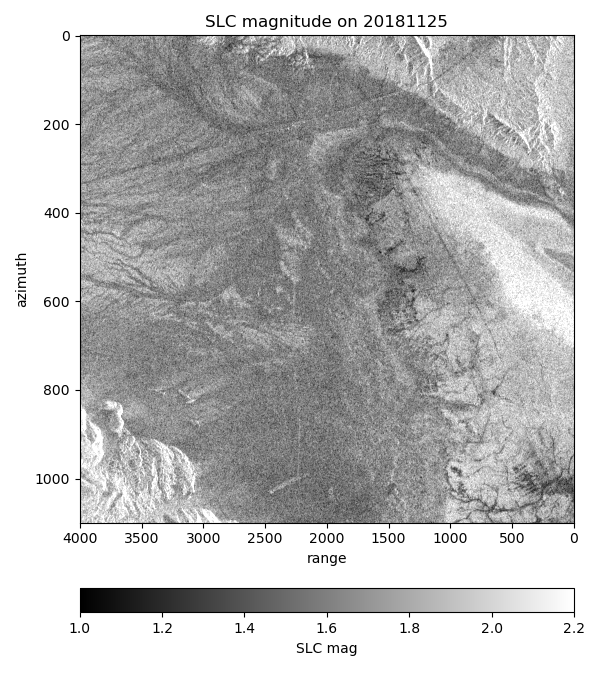

In [39]:
my_vmin = 1
my_vmax = 2.2

plt.figure(figsize=(subplot_dx,subplot_dy),tight_layout=True)
plt.imshow(np.log10(np.abs(slc2)), vmin=my_vmin, vmax=my_vmax, cmap='gray', aspect='auto')
plt.xlim(np.shape(slc1)[1], 0)
plt.xlabel('range')
plt.ylabel('azimuth')
plt.title('SLC magnitude on '+str(date1))
plt.colorbar(location='bottom',label='SLC mag',pad=0.1)
plt.show()

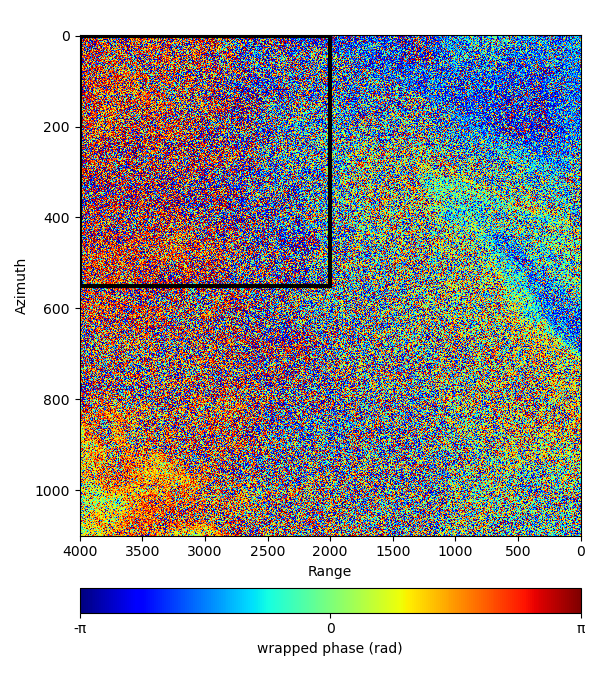

In [40]:
# make the interferogram (full res)
igram = (slc1*np.conj(slc2))

plt.figure(figsize=(subplot_dx,subplot_dy),tight_layout=True)
plt.imshow(np.angle(igram), cmap='jet', aspect='auto', interpolation='none',vmin=-np.pi,vmax=np.pi)
plt.xlim(np.shape(slc1)[1], 0)
plt.xlabel('Range')
plt.ylabel('Azimuth')
#plt.title('Full resolution, wrapped '+str(date1)+'-'+str(date2))
plt.title('   ')
labels=['-\u03C0','0','\u03C0']
cbar = plt.colorbar(location='bottom',ticks=[-np.pi,0,np.pi],label='wrapped phase (rad)',pad=0.08)
cbar.ax.set_xticklabels(labels)
plt.gca().add_patch(Rectangle((2000,0),2000,550,edgecolor='k',facecolor='none',lw=3))

# set default font size for the whole figure.
plt.rcParams.update({'font.size': 10})
plt.rcParams["font.family"] = "Arial"

#plt.savefig('/data/ocp4/LagunaSalada/Data_and_Figs/8_unwrap/raw_igram_for_AGU23_poster.png',transparent='True')

plt.show()

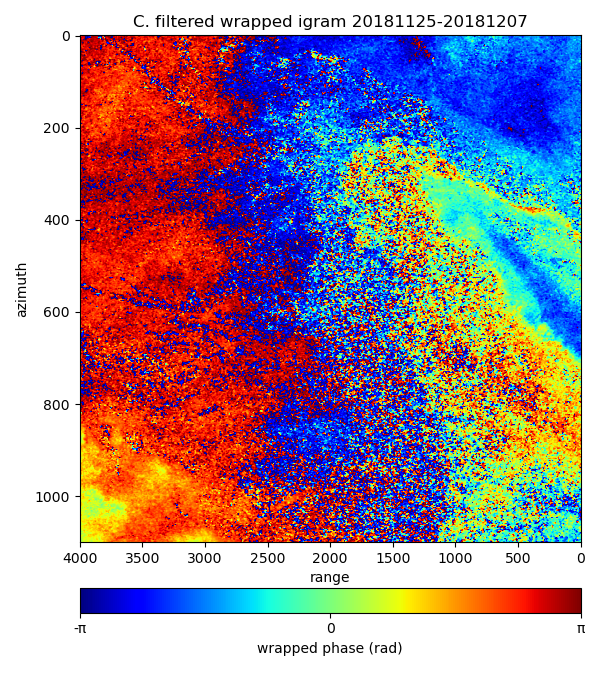

In [41]:
# filter it
alooks=4
rlooks=20
s1=slc1*np.conj(slc1)
s2=slc2*np.conj(slc2)
a1r=gaussian_filter(np.real(s1), sigma=[alooks/4,rlooks/4])
a1i=gaussian_filter(np.imag(s1), sigma=[alooks/4,rlooks/4])
a2r=gaussian_filter(np.real(s2), sigma=[alooks/4,rlooks/4])
a2i=gaussian_filter(np.imag(s2), sigma=[alooks/4,rlooks/4])
a1 = a1r+1j*a1i
a2 = a2r+1j*a2i
filtimager=gaussian_filter(np.real(igram), sigma=[alooks/4,rlooks/4])
filtimagei=gaussian_filter(np.imag(igram), sigma=[alooks/4,rlooks/4])
filt_intTemp = filtimager+1j*filtimagei
scaler    = np.sqrt(a1*a2)
filt_igram = filt_intTemp/scaler

# plot the filtered, wrapped igram.
plt.figure(figsize=(subplot_dx,subplot_dy),tight_layout=True)
plt.imshow(np.angle(filt_igram),cmap='jet',aspect='auto',interpolation='none',vmin=-np.pi,vmax=np.pi)
plt.xlim(np.shape(slc1)[1], 0)
plt.xlabel('range')
plt.ylabel('azimuth')
plt.title('C. filtered wrapped igram '+str(date1)+'-'+str(date2))
labels=['-\u03C0','0','\u03C0']
cbar = plt.colorbar(location='bottom',ticks=[-np.pi,0,np.pi],label='wrapped phase (rad)',pad=0.07)
cbar.ax.set_xticklabels(labels)
plt.show()

!!! Can skip the next cell if I want to use the same igram I unwrapped last time !!!

In [42]:
%%script echo skipping
# unwrap the full resolution igram directly. The filtered ones are already unwrapped.

# have to save the full res igram first to feed it into SNAPHU
driver=gdal.GetDriverByName('ISCE')
colds = driver.Create(workdir+'cropped_LS_with_western_mtns/igram_temp.r4',dx,dy,1,gdal.GDT_Float32)
colds.GetRasterBand(1).WriteArray(np.angle(igram)); colds=None

# set input file name to SNAPHU and the file name SNAPHU will create 
outfile = workdir+'cropped_LS_with_western_mtns/full_res_unwrapped/'+date1+'-'+date2+'_FR.unw'
inputFilename = workdir+'cropped_LS_with_western_mtns/igram_temp.r4'

snaphu = Snaphu()
snaphu.setInput(inputFilename)
snaphu.setOutput(outfile)
snaphu.setWidth(dx) # this was 4800 for Rowena's test 
snaphu.setCostMode('DEFO') # try SMOOTH, was DEFO to start
snaphu.setEarthRadius(6356236.24233467)
snaphu.setWavelength(0.0562356424)
snaphu.setAltitude(788151.7928135)
snaphu.setCorFileFormat('FLOAT_DATA')
snaphu.setIntFileFormat('FLOAT_DATA')
snaphu.setUnwFileFormat('FLOAT_DATA')

print("Preparing")
snaphu.prepare()
snaphu.unwrap()

copyThisFile = outputdir+'igram_temp.r4.xml'
putItHere = outfile+'.xml'

# copy the file
shutil.copy(copyThisFile,putItHere)

skipping


In [43]:
outfile = workdir+'cropped_LS_with_western_mtns/full_res_unwrapped/'+date1+'-'+date2+'_FR.unw'

# load in what we just produced: the full res, unwrapped igram (not filtered first, will look bad)
f1 = gdal.Open(outfile, gdal.GA_ReadOnly)
unwr_FR_igram = f1.ReadAsArray()
f1 = None

# also load in the filtered, unwrapped version (will look better/smoother)
filt_unw_igram_file = outputdir+'filt_unwrapped/'+date1+'_'+date2+'_filt.unw'
f1 = gdal.Open(filt_unw_igram_file, gdal.GA_ReadOnly)
unwr_filt_igram = f1.ReadAsArray()
f1 = None

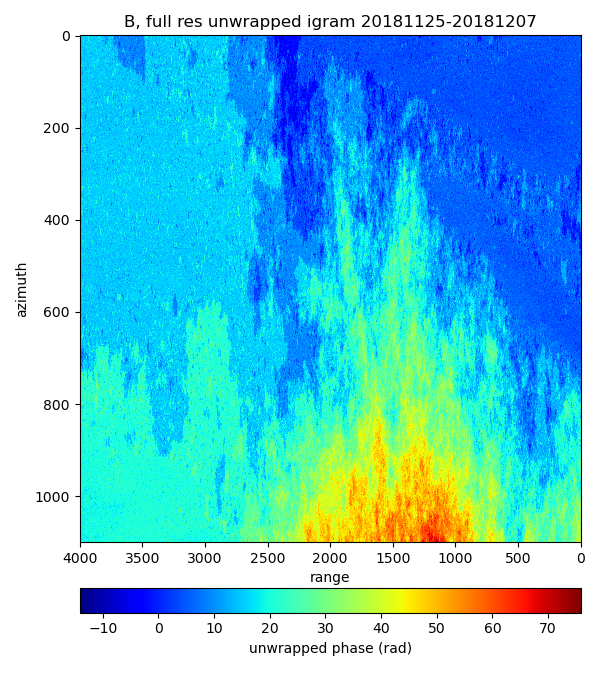

In [44]:
# plot the full res unwrapped igram (should look bad)
plt.figure(figsize=(subplot_dx,subplot_dy),tight_layout=True)
plt.imshow(unwr_FR_igram, cmap='jet', aspect='auto', interpolation='none')
plt.xlim(np.shape(slc1)[1], 0)
plt.xlabel('range')
plt.ylabel('azimuth')
plt.title('B, full res unwrapped igram '+str(date1)+'-'+str(date2))
plt.colorbar(location='bottom',label='unwrapped phase (rad)',pad=0.07)
plt.show()

In [45]:
print(-35/(2*np.pi))

-5.570423008216337


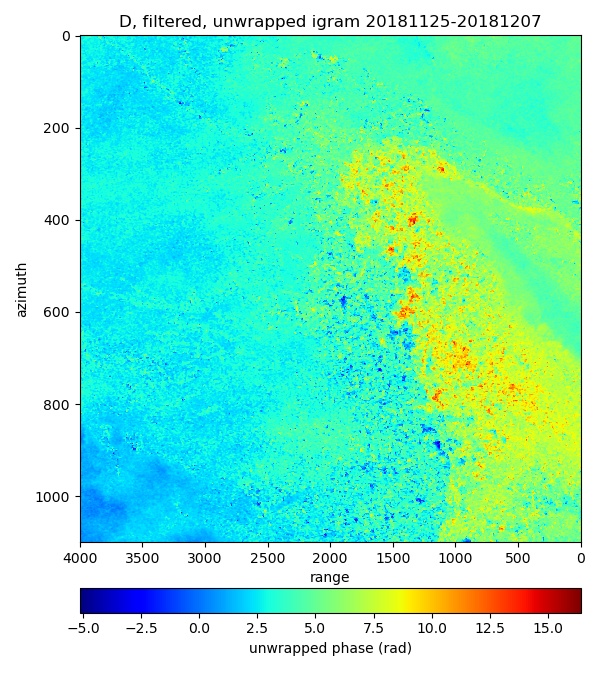

In [46]:
# plot the filtered unwrapped igram (should look better)

# take out a multiple of 2pi to get median value closer to zero for easier color bar. 
np.round(np.median(unwr_filt_igram)/(2*np.pi))

plt.figure(figsize=(subplot_dx,subplot_dy),tight_layout=True)
plt.imshow(unwr_filt_igram, cmap='jet', aspect='auto', interpolation='none')
plt.xlim(np.shape(slc1)[1], 0)
plt.xlabel('range')
plt.ylabel('azimuth')
plt.title('D, filtered, unwrapped igram '+str(date1)+'-'+str(date2))
plt.colorbar(location='bottom',label='unwrapped phase (rad)',pad=0.07)
plt.show()

In [47]:
# Calculate the unfilt, unwrapped igram and the noise term 
noise_term = np.angle(np.exp(1j*np.angle(igram)) * np.conj(np.exp(1j*np.angle(filt_igram))))
unfilt_unwr = noise_term + unwr_filt_igram

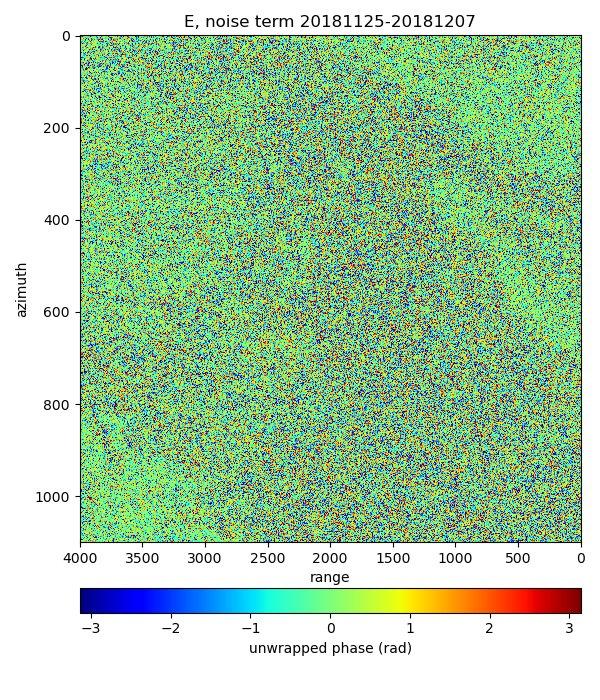

In [48]:
# plot the noise term 
plt.figure(figsize=(subplot_dx,subplot_dy),tight_layout=True)
plt.imshow(noise_term, cmap='jet', aspect='auto', interpolation='none')
plt.xlim(np.shape(slc1)[1], 0)
plt.xlabel('range')
plt.ylabel('azimuth')
plt.title('E, noise term '+str(date1)+'-'+str(date2))
plt.colorbar(location='bottom',label='unwrapped phase (rad)',pad=0.07)
plt.show()

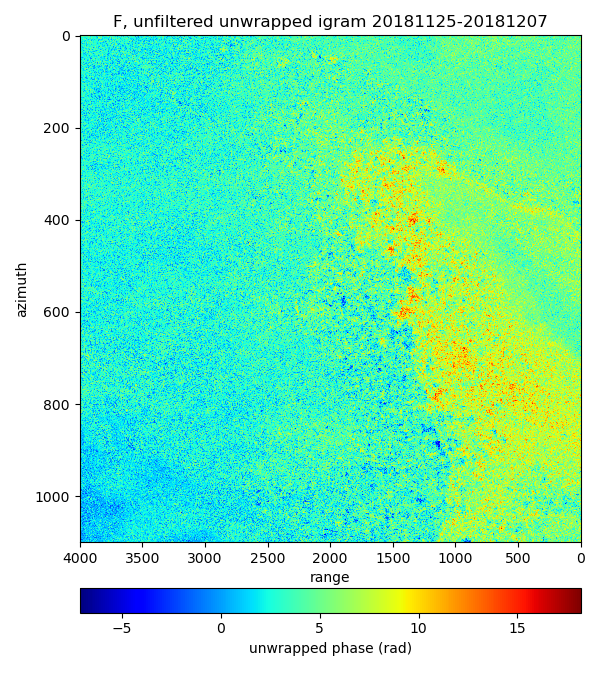

In [49]:
# plot the unfilt, unwrapped igram 
plt.figure(figsize=(subplot_dx,subplot_dy),tight_layout=True)
plt.imshow(unfilt_unwr, cmap='jet', aspect='auto', interpolation='none')
plt.xlim(np.shape(slc1)[1], 0)
plt.xlabel('range')
plt.ylabel('azimuth')
plt.title('F, unfiltered unwrapped igram '+str(date1)+'-'+str(date2))
plt.colorbar(location='bottom',label='unwrapped phase (rad)',pad=0.07)
plt.show()

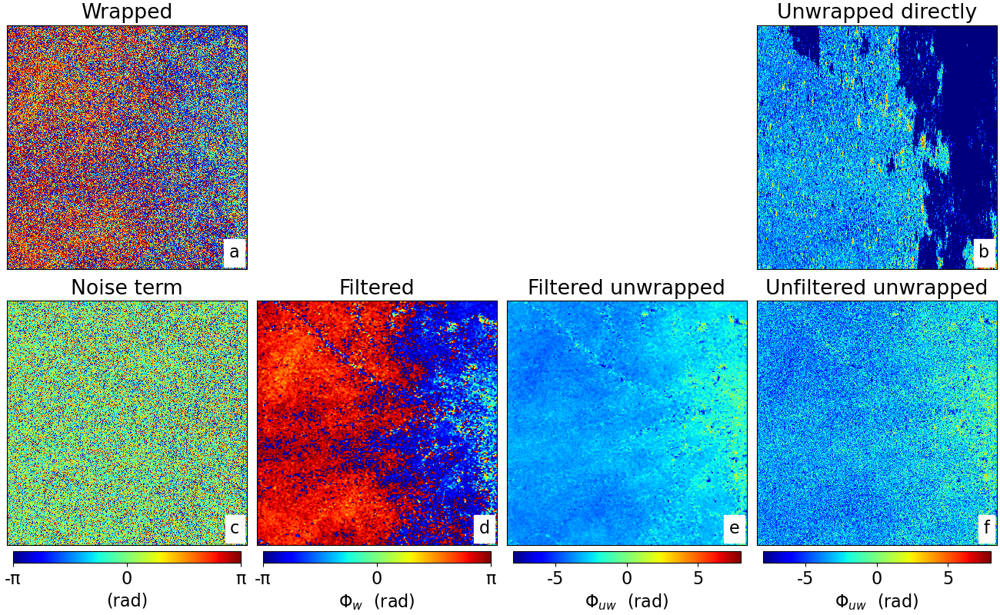

In [18]:
# now plot all versions at once 
fig_dx = 13
fig_dy = 8
vmin = -8
vmax = 8

# labels for the colorbar for unwrapped igrams.
tx = [-5,0,5]

# set default font size for the whole figure.
fs = 16
plt.rcParams.update({'font.size': 16})
plt.rcParams["font.family"] = "Arial"

# constrained layout makes sure that subplots are same size and don't change with/without colorbar.
fig = plt.figure(figsize=(fig_dx,fig_dy),constrained_layout=True) # 

plt.subplot(2,4,1)
plt.imshow(np.angle(igram),cmap='jet',aspect='auto',interpolation='nearest',vmin=-np.pi,vmax=np.pi)
plt.xticks([]); plt.yticks([])
plt.xlim([4000,2000]); plt.ylim([550,0])
props = dict(boxstyle='square',facecolor='white',edgecolor='white')
plt.text(0.97,0.03,'a',bbox=props,horizontalalignment='right',verticalalignment='bottom',transform=plt.gca().transAxes)
plt.title('Wrapped')

plt.subplot(2,4,4)
plt.imshow(unwr_FR_igram-6*np.pi,cmap='jet',aspect='auto',interpolation='nearest',vmin=vmin,vmax=vmax)
plt.xticks([]); plt.yticks([])
plt.xlim([4000,2000]); plt.ylim([550,0])
plt.text(0.97,0.03,'b',bbox=props,horizontalalignment='right',verticalalignment='bottom',transform=plt.gca().transAxes)
plt.title('Unwrapped directly')

# Second row 
plt.subplot(2,4,5)
plt.imshow(noise_term,cmap='jet',aspect='auto',interpolation='nearest',vmin=-np.pi,vmax=np.pi)
plt.xticks([]); plt.yticks([])
plt.xlim([4000,2000]); plt.ylim([550,0])
plt.text(0.97,0.03,'c',bbox=props,horizontalalignment='right',verticalalignment='bottom',transform=plt.gca().transAxes)
labels=['-\u03C0','0','\u03C0']
cbar = plt.colorbar(location='bottom',ticks=[-np.pi,0,np.pi],label='(rad)',pad=0.01,shrink=0.95)
cbar.ax.set_xticklabels(labels)
plt.title('Noise term')

plt.subplot(2,4,6)
plt.imshow(np.angle(filt_igram),cmap='jet',aspect='auto',interpolation='nearest',vmin=-np.pi,vmax=np.pi)
plt.xticks([]); plt.yticks([])
plt.xlim([4000,2000]); plt.ylim([550,0])
plt.text(0.97,0.03,'d',bbox=props,horizontalalignment='right',verticalalignment='bottom',transform=plt.gca().transAxes)
labels=['-\u03C0','0','\u03C0']
cbar = plt.colorbar(location='bottom',ticks=[-np.pi,0,np.pi],label='$\u03A6_{w}$  (rad)',pad=0.01,shrink=0.95)
cbar.ax.set_xticklabels(labels)
plt.title('Filtered')

plt.subplot(2,4,7)
plt.imshow(unwr_filt_igram-2*np.pi,cmap='jet',aspect='auto',interpolation='nearest',vmin=vmin,vmax=vmax)
cbar = plt.colorbar(location='bottom',ticks=tx,label='$\u03A6_{uw}$  (rad)',pad=0.01,shrink=0.95)
cbar.ax.set_xticklabels(tx)
plt.xticks([]); plt.yticks([])
plt.xlim([4000,2000]); plt.ylim([550,0])
plt.text(0.97,0.03,'e',bbox=props,horizontalalignment='right',verticalalignment='bottom',transform=plt.gca().transAxes)
plt.title('Filtered unwrapped')

plt.subplot(2,4,8)
plt.imshow(unfilt_unwr-2*np.pi,cmap='jet',aspect='auto',interpolation='nearest',vmin=vmin,vmax=vmax)
cbar = plt.colorbar(location='bottom',ticks=tx,label='$\u03A6_{uw}$  (rad)',pad=0.01,shrink=0.95)
cbar.ax.set_xticklabels(tx)
plt.xticks([]); plt.yticks([])
plt.xlim([4000,2000]); plt.ylim([550,0])
plt.text(0.97,0.03,'f',bbox=props,horizontalalignment='right',verticalalignment='bottom',transform=plt.gca().transAxes)
plt.title('Unfiltered unwrapped')

#plt.subplots_adjust(wspace=0.1)

plt.show()

#plt.savefig('/data/ocp4/LagunaSalada/Data_and_Figs/8_unwrap/unwrap_method_fig.png',transparent='True')

This is extra if I need to show 2pi jumps from unwrapping. 

/tmp/ipykernel_774208/1931387215.py:9: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(mpl.cm.ScalarMappable(norm=norm,cmap=cmap),orientation='vertical',pad=0.03,label='# 2\u03C0 jumps');


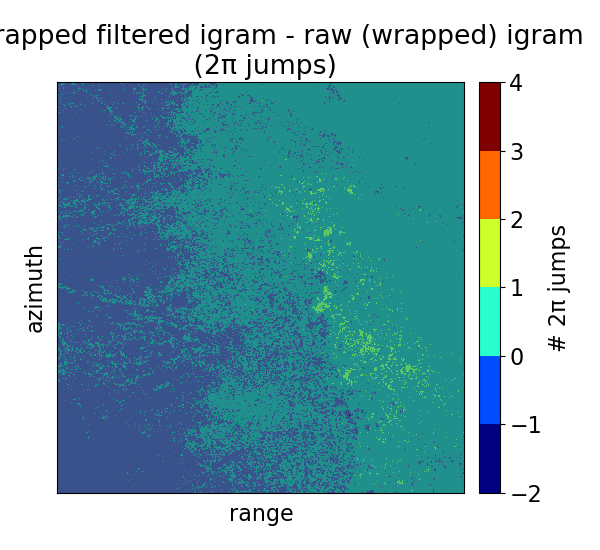

In [19]:
two_pi_jumps = (unwr_filt_igram-np.angle(filt_igram))/(2*np.pi)
# print(np.round(two_pi_jumps))
import matplotlib as mpl
cmap = mpl.cm.jet  # define the colormap
bounds=[-2,-1,0,1,2,3,4]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N) #, extend='both'
plt.figure(figsize=(6,5.5),tight_layout=True) 
plt.imshow(np.fliplr(np.round(two_pi_jumps)),aspect='auto',interpolation='nearest')
plt.colorbar(mpl.cm.ScalarMappable(norm=norm,cmap=cmap),orientation='vertical',pad=0.03,label='# 2\u03C0 jumps'); 
plt.title('unwrapped filtered igram - raw (wrapped) igram\n (2\u03C0 jumps)'); plt.xlabel('range'); plt.ylabel('azimuth')
plt.xticks([]); plt.yticks([])
plt.show()